In [309]:
from tqdm import tqdm
import torch.nn as nn
import torch
from safetensors.torch import load_file  # comes with HF if safetensors installed
import time
from transformers import AutoModelForSequenceClassification, AutoTokenizer, AutoConfig
import numpy as np, time
from sklearn.model_selection import train_test_split
from sklearn.pipeline import make_pipeline
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from scipy.special import softmax
import os
from typing import List
os.chdir("/data/resources/weichel-llama3/work/projects/nace_classification/nace_report_topic_analysis")

import preprocessing
from NACE_helper import NACE_code_structure, NACE_helper
import pandas as pd
from BERT_classifier.Backtracking import llm_summary
np.random.seed(7)

In [ ]:
sections_full = NACE_code_structure.level_1 
divisions_full = NACE_code_structure.level_2
classes_full = NACE_code_structure.level_3

In [235]:
# ------------------------------
# 1) Hierarchy
# ------------------------------
sections = {"A": "Agriculture", "C": "Manufacturing", "K": "Financials", "F": "Construction", "J": "Information and Communication", "N": "Administrative and Support Service Activities"}
sections = {"A": "Agriculture", "C": "Manufacturing", "F": "Construction", "J": "Information and Communication", "N": "Administrative and Support Service Activities"}
divisions = {
    #"A": ["1", "2", "3"],
    #"C": ['10', '11', '12', '13', '14', '15', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25', '26', '27', '28', '29', '30', '31', '32', '33'], 
    #"C": ['21', '26'], 
    #"K": ['64', '65', '66'],
    "A": ["1", "3"],
    "C": ['21', '26'], 
    #"K": ['64', '66'],
    "F": ['41', '42'],
    "J": ['58', '61'],
    "N": ['77', '81'],
    }
classes = {
    "1": ['01.5', '01.6'],
    "3": ['03.1', '03.2'],
    "21": ['21.1', '21.2'],
    "26": ["26.1", "26.6"],
    #"64": ['64.1', '64.3', '64.9', '64.2'],
    #"66": ['66.1', '66.2', '66.3'],
    "41": ["41.1", "41.2"],
    "42": ["42.1", "42.2", "42.9"],
    "58": ['58.1', '58.2'],
    "61": ['61.1', '61.2'],
    "77": ["77.1", "77.3"],
    "81": ['81.3', '81.3'],
    }

division_of_class = {}
section_of_division = {}
for sec, divs in divisions.items():
    for d in divs:
        section_of_division[d] = sec
        for c in classes[d]:
           division_of_class[c] = d
all_classes = list(division_of_class.keys())
all_classes

['01.5',
 '01.6',
 '03.1',
 '03.2',
 '21.1',
 '21.2',
 '26.1',
 '26.6',
 '41.1',
 '41.2',
 '42.1',
 '42.2',
 '42.9',
 '58.1',
 '58.2',
 '61.1',
 '61.2',
 '77.1',
 '77.3',
 '81.3']

In [236]:
# load dataset (from DS 2 -> calibration)

dataset_path_3 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_3__2nd_approach__nace_level_3__cos_thres_0.35/val_data.csv"
df_val_3 = pd.read_csv(dataset_path_3)
dataset_path_3 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_3__2nd_approach__nace_level_3__cos_thres_0.35/train_data.csv"
df_train_3 = pd.read_csv(dataset_path_3)
dataset_path_3 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_3__2nd_approach__nace_level_3__cos_thres_0.35/statistics.csv"
df_statistics_3 = pd.read_csv(dataset_path_3)

df_val_3 = df_val_3[df_val_3["NACE_Code"].apply(lambda x: x in all_classes)]

dataset_path_2 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_2__2nd_approach__nace_level_2__cos_thres_0.35/val_data.csv"
df_val_2 = pd.read_csv(dataset_path_2)
dataset_path_2 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_2__2nd_approach__nace_level_2__cos_thres_0.35/train_data.csv"
df_train_2 = pd.read_csv(dataset_path_2)    
dataset_path_2 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_2__2nd_approach__nace_level_2__cos_thres_0.35/statistics.csv"
df_statistics_2 = pd.read_csv(dataset_path_2)
df_val_2 = df_val_2[df_val_2["NACE_Code"].apply(lambda x: x in list(classes.keys()))]

dataset_path_1 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_1__2nd_approach__nace_level_1__cos_thres_0.4/val_data.csv"
df_val_1 = pd.read_csv(dataset_path_1)
dataset_path_1 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_1__2nd_approach__nace_level_1__cos_thres_0.4/train_data.csv"
df_train_1 = pd.read_csv(dataset_path_1)
dataset_path_1 = "data/training_data/approach_2/dataset__reports_subset_from_full_data_2_sentence_len_6__min_chunk_len_100__cos_thresh_0.4__nace_level_1__2nd_approach__nace_level_1__cos_thres_0.4/statistics.csv"
df_statistics_1 = pd.read_csv(dataset_path_1)
df_val_1 = df_val_1[df_val_1["NACE_Code"].apply(lambda x: x in list(sections.keys()))]

X_lvl_1_cal = df_val_1["text"].to_numpy()
y_lvl_1_cal = df_val_1["NACE_Code"].to_numpy()

X_lvl_2_cal = df_val_2["text"].to_numpy()
y_lvl_2_cal = df_val_2["NACE_Code"].to_numpy()

X_lvl_3_cal = df_val_3["text"].to_numpy()
y_lvl_3_cal = df_val_3["NACE_Code"].to_numpy()

X_lvl_3_cal, X_lvl_3_test, y_lvl_3_cal, y_lvl_3_test = train_test_split(X_lvl_3_cal, y_lvl_3_cal, test_size=0.3, random_state=0, stratify=y_lvl_3_cal)

len(X_lvl_1_cal), len(X_lvl_2_cal), len(X_lvl_3_cal)

(3292, 2818, 1078)

In [237]:
nace_descriptions = pd.read_csv("data/NACE_Rev2_Structure_Explanatory_Notes_EN__1_.tsv", sep="\t")
get_description = lambda code: nace_descriptions[nace_descriptions["CODE"] == code]["NAME"].iloc[0]

def build_tree_str(sections, divisions, classes, indent="  "):
    lines = []
    for sec_code, sec_name in sorted(sections.items()):
        try: 
            num_sentences = df_statistics_1[df_statistics_1["NACE_Code"] == sec_code]["Sentences"].iloc[0]
        except IndexError:
            num_sentences = 0

        lines.append(f"{sec_code} — {sec_name}: {num_sentences} training samples")

        for div_code in sorted(divisions.get(sec_code, []), key=lambda x: (len(x), x)):
            try: 
                num_sentences = df_statistics_2[df_statistics_2['NACE_Code'] == div_code]['Sentences'].iloc[0]
            except IndexError:
                num_sentences = 0
            lines.append(f"{indent}{div_code}: {get_description(div_code)} {num_sentences}")

            for cls_code in sorted(classes.get(div_code, []), key=lambda x: tuple(map(int, x.split(".")))):
                try: 
                    num_sentences = df_statistics_3[df_statistics_3['NACE_Code'] == cls_code]['Sentences'].iloc[0]
                except IndexError:
                    num_sentences = 0
                lines.append(f"{indent}{indent}{cls_code}: {get_description(cls_code)} {num_sentences}")
    return "\n".join(lines)


print(build_tree_str(sections, divisions, classes))

A — Agriculture: 1372 training samples
  1: Crop and animal production, hunting and related service activities 940
    01.5: Mixed farming 191
    01.6: Support activities to agriculture and post-harvest crop activities 193
  3: Fishing and aquaculture 2003
    03.1: Fishing 128
    03.2: Aquaculture 591
C — Manufacturing: 1678 training samples
  21: Manufacture of basic pharmaceutical products and pharmaceutical preparations 3051
    21.1: Manufacture of basic pharmaceutical products 14
    21.2: Manufacture of pharmaceutical preparations 826
  26: Manufacture of computer, electronic and optical products 948
    26.1: Manufacture of electronic components and boards 176
    26.6: Manufacture of irradiation, electromedical and electrotherapeutic equipment 158
F — Construction: 10094 training samples
  41: Construction of buildings 784
    41.1: Development of building projects 845
    41.2: Construction of residential and non-residential buildings 1631
  42: Civil engineering 931
    42

In [238]:
print(build_tree_str(sections_full, divisions_full, classes_full))


A — AGRICULTURE, FORESTRY AND FISHING: 1372 training samples
  1: Crop and animal production, hunting and related service activities 940
    01.1: Growing of non-perennial crops 43
    01.2: Growing of perennial crops 1
    01.3: Plant propagation 23
    01.4: Animal production 9
    01.5: Mixed farming 191
    01.6: Support activities to agriculture and post-harvest crop activities 193
    01.7: Hunting, trapping and related service activities 0
  2: Forestry and logging 412
    02.1: Silviculture and other forestry activities 13
    02.2: Logging 21
    02.3: Gathering of wild growing non-wood products 3
    02.4: Support services to forestry 22
  3: Fishing and aquaculture 2003
    03.1: Fishing 128
    03.2: Aquaculture 591
B — MINING AND QUARRYING: 9239 training samples
  5: Mining of coal and lignite 169
    05.1: Mining of hard coal 0
    05.2: Mining of lignite 2
  6: Extraction of crude petroleum and natural gas 1630
    06.1: Extraction of crude petroleum 279
    06.2: Extrac

In [239]:
y_lvl_3_cal_lvl_2 = np.vectorize(lambda x: NACE_helper.get_all_level(x)[2])(y_lvl_3_cal)
y_lvl_3_cal_lvl_2

array(['41', '41', '41', ..., '41', '21', '77'], dtype='<U2')

In [240]:
y_lvl_2_cal_lvl_1 = np.vectorize(NACE_helper.get_level_1_nace)(y_lvl_2_cal)
y_lvl_2_cal_lvl_1

array(['C', 'C', 'C', ..., 'N', 'C', 'J'], dtype='<U1')

In [241]:
# ------------------------------
# 2) Import BERT Models
# ------------------------------

def load_custom_bert_from_checkpoint(ckpt_path: str, num_layers_base: int = 1, num_labels_base: int = None):
    # 1. Load the saved config (includes custom_hidden, custom_num_layers)
    config = AutoConfig.from_pretrained(ckpt_path)

    full_config = AutoConfig.from_pretrained(ckpt_path.replace(os.path.basename(ckpt_path), "training_config.json"))

    # 2. Build a model from config (bare BertForSequenceClassification)
    model = AutoModelForSequenceClassification.from_config(config)

    # 3. Rebuild the SAME classifier architecture as in training
    hidden = getattr(config, "custom_hidden", 512)  # fallback if not in config
    num_layers = getattr(full_config, "num_layers", num_layers_base)
    num_labels = getattr(config, "num_labels", num_labels_base)

    layers = []
    for i in range(num_layers):
        in_dim = config.hidden_size if i == 0 else hidden
        layers.append(nn.Linear(in_dim, hidden))
        layers.append(nn.GELU())
        layers.append(nn.Dropout(0.2))

    layers.append(nn.Linear(hidden, num_labels))
    model.classifier = nn.Sequential(*layers)

    # 4. Load weights from model.safetensors
    state_dict = load_file(os.path.join(ckpt_path, "model.safetensors"))
    model.load_state_dict(state_dict, strict=True)  # will fail loudly if mismatch

    # 5. Inference mode
    model.eval()
    return model

ckpt_path_sec = "results/BERT_models/NACE_classification/095_results__data_approach_3__desc_lvl_level_1__num_layers_3__cos_thres_0.45bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-768"
# -> All Labels exept G,S,T,N
ckpt_path_sec = "results/BERT_models/NACE_classification/037_results__data_approach_3__desc_lvl_level_1_dataset_2__num_layers_1__cos_thres_0.5bert-base-uncased__train_full_model__some_labels__only_labels/checkpoint-743"

# -> ["A","C","K"]
ckpt_path_sec = "results/BERT_models/NACE_classification/101_results__data_approach_3__desc_lvl_level_1__num_layers_2__cos_thres_0.5bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-77"

# -> ["A","C","K","F","J","N"]
ckpt_path_sec = "results/BERT_models/NACE_classification/105_results__data_approach_3__desc_lvl_level_1__num_layers_2__cos_thres_0.4bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-324"

# -> ["A","C",F","J","N"]
ckpt_path_sec = "results/BERT_models/NACE_classification/110_results__data_approach_3__desc_lvl_level_1__num_layers_2__cos_thres_0.5bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-120"

sec_clf = load_custom_bert_from_checkpoint(ckpt_path_sec)

ckpt_path_div = {
    "A": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_A/001_results__data_approach_2__num_layers_2__cos_thres_0.4bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-69",
    "C": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_C/003_results__data_approach_2__num_layers_2__cos_thres_0.4bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-198",
    # This one is for K -> [64,65,66]
    #"K": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_K/001_results__data_approach_2__num_layers_2__cos_thres_0.4bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-634",
    # This one is for K -> [64,66]
    "K": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_K/002_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-69",
    "F": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_F/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-260",
    "J": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_J/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-48",
    "N": "results/BERT_models/NACE_classification/NACE_level_2/NACE_class_N/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-300", 
} 
div_clf_dict = {k: load_custom_bert_from_checkpoint(v) for k,v in ckpt_path_div.items()}
ckpt_path_cls = {
    "1": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_1/016_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-45",
    "3": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_3/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-108",
    "21": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_21/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-170",
    "26": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_26/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-39",
    "64": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_64/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-771",
    "66": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_66/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-225",
    "41": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_41/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-94", 
    "42": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_42/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-115", 
    "58": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_58/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-112", 
    "61": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_61/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-148", 
    "77": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_77/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-924", 
    "81": "results/BERT_models/NACE_classification/NACE_level_3/NACE_class_81/001_results__data_approach_2__num_layers_2__cos_thres_0.35bert-base-uncased__train_full_model__some_labels_no_G__only_labels/checkpoint-27", 
}
cls_clf_dict = {k: load_custom_bert_from_checkpoint(v) for k,v in ckpt_path_cls.items()}

# tokenizer is used for all models
tokenizer = AutoTokenizer.from_pretrained(ckpt_path_sec) 

idx_sec = sec_clf.config.label2id
idx_div_dict = {k: v.config.label2id for k, v in div_clf_dict.items()}
idx_cls_dict = {k: v.config.label2id for k, v in cls_clf_dict.items()}

In [313]:
import numpy as np

def softmax(x, temperature=1.0):
    """
    Softmax with temperature.

    Args:
        x (array-like): input logits
        temperature (float): temperature parameter (T > 0)

    Returns:
        np.ndarray: probability distribution
    """
    x = np.asarray(x, dtype=np.float64)

    # scale by temperature
    x = x / temperature

    # numerical stability
    x = x - np.max(x)

    exp_x = np.exp(x)
    return exp_x / np.sum(exp_x)

In [314]:
TEMPERATURE = 1.0
def BERT_classification_chunk(chunks: List[str], model, tokenizer=tokenizer, temperature=TEMPERATURE, waitbar=False) -> List:

    probas = []

    if waitbar:
        chunks = tqdm(chunks)
    for chunk in chunks: 
        inputs = tokenizer(chunk, return_tensors="pt", truncation=True)
        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits.squeeze(0)

        probas.append(softmax(logits, temperature=temperature))
    return np.array(probas)

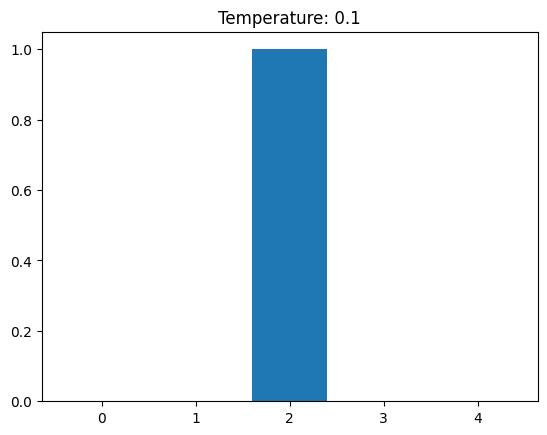

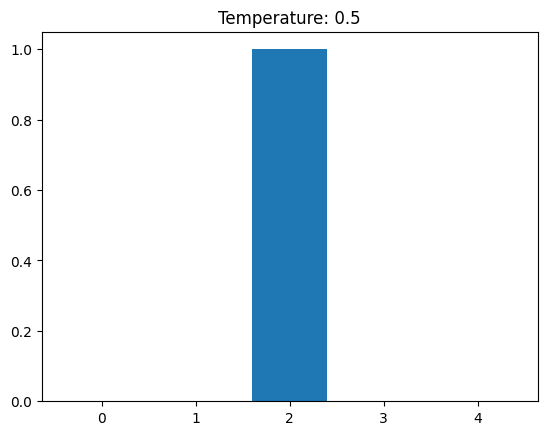

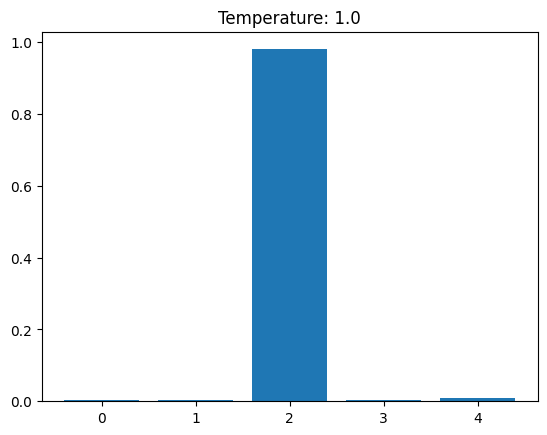

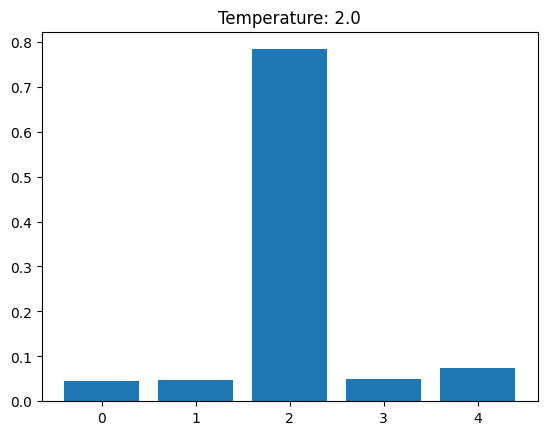

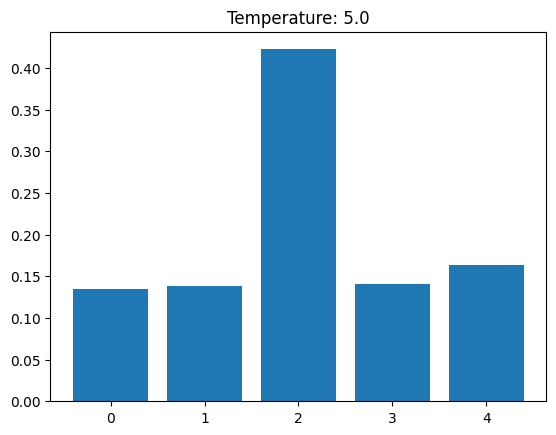

In [ ]:
import matplotlib.pyplot as plt

for i in [0.1, 0.5, 1.0, 2.0, 5.0]:
    logits_list = BERT_classification_chunk(X_lvl_1_cal[:2], model=sec_clf, temperature=i)
    logits_list
    plt.figure()
    plt.title(f"Temperature: {i}")
    plt.bar(range(len(logits_list[0])), logits_list[0])


In [245]:
# ------------------------------
# 5) RAPS + reject calibration
# ------------------------------
K_FREE = 1
LAMBDA = 0.05

def renorm_rows(v):
    s = v.sum(axis=1, keepdims=True)
    return np.divide(v, s, out=np.full_like(v, 1.0 / v.shape[1]), where=(s > 0))

def raps_score_rowwise_argsort(P, true_idx, k_free=K_FREE, lam=LAMBDA):
    order = np.argsort(-P, axis=1)
    P_sorted = np.take_along_axis(P, order, axis=1)
    true_mask = (order == true_idx[:, None])
    rank_pos = true_mask.argmax(axis=1)   # exact argsort rank, 0-based
    r = rank_pos + 1
    cumsum = np.cumsum(P_sorted, axis=1)
    cum = cumsum[np.arange(P.shape[0]), rank_pos]
    penalty = lam * np.maximum(0, r - k_free)
    return cum + penalty

def reject_score(P_sec):
    return 1.0 - P_sec.max(axis=1)

def qthr(a, eps):
    return float(np.quantile(a, 1.0-eps, method="higher"))

# Predict probabilities on calibration in batch
t0 = time.time()
print(f"Predict {len(X_lvl_1_cal)} Sections.")
P_sec_cal = BERT_classification_chunk(X_lvl_1_cal, sec_clf, waitbar=True)

print(f"Predict {len(X_lvl_2_cal)} Divisions.")
P_div_cal_dict = {k: BERT_classification_chunk(X_lvl_2_cal, v, waitbar=True) for k, v in div_clf_dict.items()}

print(f"Predict {len(X_lvl_3_cal)} Classes.")
P_cls_cal_dict = {k: BERT_classification_chunk(X_lvl_3_cal, v, waitbar=True) for k, v in cls_clf_dict.items()}
t_prob = time.time() - t0

Predict 3292 Sections.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 3292/3292 [01:50<00:00, 29.84it/s]


Predict 2818 Divisions.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 2818/2818 [01:32<00:00, 30.46it/s]


Predict 1078 Classes.


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1078/1078 [00:37<00:00, 29.05it/s]


In [246]:
# --- thresholds ---
EPS_SEC = EPS_DIV = EPS_CLS = 0.1
EPS_REJECT = 0.1
MAX_LEAF_SIZE = 3

true_sec_idx = np.array([idx_sec[s] for s in y_lvl_1_cal])
raps_sec_scores = raps_score_rowwise_argsort(P_sec_cal, true_sec_idx)
tau_sec = qthr(raps_sec_scores, EPS_SEC)

In [247]:
# Division threshold: Mondrian-by-parent (true section)
tau_div_dict = {}
for div, _ in div_clf_dict.items():

    #print(f"Get tau for classifier {div}: {idx_div_dict[div].keys()}")

    # Only take correctly chosen sections (lvl 1)
    mask = (y_lvl_2_cal_lvl_1 == div)
    div_scores = np.empty(len(X_lvl_2_cal[mask]))
    if not np.any(mask):
        continue
    
    child = list(idx_div_dict[div].keys())
    child_idx = np.array([idx_div_dict[div][d] for d in child], dtype=int)

    # Probs of the highest scoring class
    P_child = renorm_rows(P_div_cal_dict[div][mask][:, child_idx])
    
    # Right division
    true_div_local = np.array([child.index(d) for d in y_lvl_2_cal[mask]], dtype=int)
    
    # S scores
    div_scores = raps_score_rowwise_argsort(P_child, true_div_local)
    
    # get tau 
    tau_div_temp = qthr(div_scores, EPS_DIV)
    tau_div_dict[div] = tau_div_temp

tau_div_dict

{'A': 0.9916846934992437,
 'C': 0.9926088161003872,
 'F': 0.9982666589886017,
 'J': 0.9975480796454353,
 'N': 0.9997311144598972}

In [248]:
# Class threshold: Mondrian-by-parent (true division)
tau_cls_dict = {}
for cls_, _ in cls_clf_dict.items(): 
    
    mask = (y_lvl_3_cal_lvl_2 == cls_)
    cls_scores = np.empty(len(X_lvl_3_cal[mask]))
    if not np.any(mask):
        continue
    
    child = list(idx_cls_dict[cls_].keys())
    child_idx = np.array([idx_cls_dict[cls_][c] for c in child], dtype=int)
    
    P_child = renorm_rows(P_cls_cal_dict[cls_][mask][:, child_idx])
    true_cls_local = np.array([child.index(c) for c in y_lvl_3_cal[mask]], dtype=int)

    cls_scores = raps_score_rowwise_argsort(P_child, true_cls_local)
    tau_cls_temp = qthr(cls_scores, EPS_CLS)
    tau_cls_dict[cls_] = tau_cls_temp

tau_cls_dict

{'1': 0.9907067155982494,
 '3': 0.9967375915234604,
 '21': 0.999195542553738,
 '26': 0.9893320828266333,
 '41': 1.05,
 '42': 0.9931831545966672,
 '58': 0.9989752963518495,
 '61': 0.999306230783021,
 '77': 0.9999757418067349,
 '81': 0.8474040782946414}

In [249]:
# Reject threshold calibrated on in-dist calibration points only
rej_scores_in = reject_score(P_sec_cal)
tau_rej = float(np.quantile(rej_scores_in, 1.0 - EPS_REJECT, method="higher"))

In [250]:
print("Tau for section:", tau_sec)
print("Tau for each division: ", tau_div_dict)
print("Tau for each class: ", tau_cls_dict)

Tau for section: 0.9832886000882923
Tau for each division:  {'A': 0.9916846934992437, 'C': 0.9926088161003872, 'F': 0.9982666589886017, 'J': 0.9975480796454353, 'N': 0.9997311144598972}
Tau for each class:  {'1': 0.9907067155982494, '3': 0.9967375915234604, '21': 0.999195542553738, '26': 0.9893320828266333, '41': 1.05, '42': 0.9931831545966672, '58': 0.9989752963518495, '61': 0.999306230783021, '77': 0.9999757418067349, '81': 0.8474040782946414}


In [251]:
# # ------------------------------
# # 6) EXACT set-based metrics (vectorized)
# # ------------------------------
# t0 = time.time()

# rej_cal = (reject_score(P_sec_cal) > tau_rej)
# kept = ~rej_cal

# # Section membership + size
# sec_in_set = (raps_score_rowwise_argsort(P_sec_cal, true_sec_idx) <= tau_sec)
# sec_membership = np.column_stack([
#     (raps_score_rowwise_argsort(P_sec_cal, np.full(len(X_cal), j, dtype=int)) <= tau_sec)
#     for j in range(P_sec_cal.shape[1])
# ])
# sec_set_size = sec_membership.sum(axis=1)

# # Division membership + size (Mondrian true parent)
# div_in_set_mondrian = np.empty(len(X_cal), dtype=bool)
# div_set_size_mondrian = np.empty(len(X_cal), dtype=int)
# for s in sections.keys():
#     mask = (y_sec_cal == s)
#     if not np.any(mask):
#         continue
#     child = divisions[s]
#     child_idx = np.array([idx_div_dict[d] for d in child], dtype=int)
#     P_child = renorm_rows(P_div_cal[mask][:, child_idx])
#     true_div_local = np.array([child.index(d) for d in y_div_cal[mask]], dtype=int)

#     div_in_set_mondrian[mask] = (raps_score_rowwise_argsort(P_child, true_div_local) <= tau_div)
#     memb = np.column_stack([
#         (raps_score_rowwise_argsort(P_child, np.full(P_child.shape[0], j, dtype=int)) <= tau_div)
#         for j in range(P_child.shape[1])
#     ])
#     div_set_size_mondrian[mask] = memb.sum(axis=1)

# # Class membership + size (Mondrian true parent)
# cls_in_set_mondrian = np.empty(len(X_cal), dtype=bool)
# cls_set_size_mondrian = np.empty(len(X_cal), dtype=int)
# for d, child in classes.items():
#     mask = (y_div_cal == d)
#     if not np.any(mask):
#         continue
#     child_idx = np.array([idx_cls_dict[c] for c in child], dtype=int)
#     P_child = renorm_rows(P_cls_cal[mask][:, child_idx])
#     true_cls_local = np.array([child.index(c) for c in y_cls_cal[mask]], dtype=int)

#     cls_in_set_mondrian[mask] = (raps_score_rowwise_argsort(P_child, true_cls_local) <= tau_cls)
#     memb = np.column_stack([
#         (raps_score_rowwise_argsort(P_child, np.full(P_child.shape[0], j, dtype=int)) <= tau_cls)
#         for j in range(P_child.shape[1])
#     ])
#     cls_set_size_mondrian[mask] = memb.sum(axis=1)

# # Hierarchical propagated membership along TRUE path
# div_in_set_hier = sec_in_set & div_in_set_mondrian
# cls_in_set_hier = div_in_set_hier & cls_in_set_mondrian

# # Output-level stats (exact for this tiny hierarchy)
# cls_size_by_div = {}
# for d, child in classes.items():
#     child_idx = np.array([idx_cls_dict[c] for c in child], dtype=int)
#     P_child = renorm_rows(P_cls_cal[:, child_idx])
#     memb = np.column_stack([
#         (raps_score_rowwise_argsort(P_child, np.full(P_child.shape[0], j, dtype=int)) <= tau_cls)
#         for j in range(P_child.shape[1])
#     ])
#     cls_size_by_div[d] = memb.sum(axis=1)

# leaf_union_size = np.zeros(len(X_cal), dtype=int)
# for s, divs_s in divisions.items():
#     s_idx = idx_sec[s]
#     s_in = sec_membership[:, s_idx]
#     add = np.zeros(len(X_cal), dtype=int)
#     for d in divs_s:
#         add += cls_size_by_div[d]
#     leaf_union_size += s_in.astype(int) * add

# reported_level = np.full(len(X_cal), "class_level", dtype=object)
# reported_level[leaf_union_size > MAX_LEAF_SIZE] = "division_level"
# reported_level[rej_cal] = "reject"

# t_exact = time.time() - t0

In [252]:
# # ------------------------------
# # 7) Print results
# # ------------------------------
# print(f"=== FULLY UNIFIED EXACT METRICS (argsort-identical RAPS), N={N:,} (cal size={len(X_cal):,}) ===")
# print(f"Data generation: {t_gen:.2f}s | Fit: {t_fit:.2f}s | predict_proba: {t_prob:.2f}s | exact-metrics: {t_exact:.2f}s\n")

# print("Thresholds:")
# print("  tau_sec:", tau_sec)
# print("  tau_div:", tau_div)
# print("  tau_cls:", tau_cls)
# print("  tau_rej (1-maxp):", tau_rej, "=> reject if max p_sec <", float(1 - tau_rej))
# print()

# print("Reject stats:")
# print("  reject_rate (all cal):", float(rej_cal.mean()))
# print("  reject_rate on flagged OOD cal points:", float(rej_cal[is_ood_cal].mean()))
# print("  reject_rate on flagged in-dist cal points:", float(rej_cal[~is_ood_cal].mean()))
# print()

# def mean_if(mask, arr_bool):
#     return float(arr_bool[mask].mean()) if np.any(mask) else float("nan")

# def avg_if(mask, arr_num):
#     return float(arr_num[mask].mean()) if np.any(mask) else float("nan")

# print("Coverage (exact set membership):")
# print("  Section coverage (unconditional):", float(sec_in_set.mean()))
# print("  Division coverage (Mondrian, unconditional):", float(div_in_set_mondrian.mean()))
# print("  Class   coverage (Mondrian, unconditional):", float(cls_in_set_mondrian.mean()))
# print("  Division coverage (hierarchical propagated):", float(div_in_set_hier.mean()))
# print("  Class   coverage (hierarchical propagated):", float(cls_in_set_hier.mean()))
# print()

# print("Coverage among KEPT (not rejected):")
# print("  Section coverage | kept:", mean_if(kept, sec_in_set))
# print("  Division Mondrian coverage | kept:", mean_if(kept, div_in_set_mondrian))
# print("  Class   Mondrian coverage | kept:", mean_if(kept, cls_in_set_mondrian))
# print("  Division hierarchical coverage | kept:", mean_if(kept, div_in_set_hier))
# print("  Class   hierarchical coverage | kept:", mean_if(kept, cls_in_set_hier))
# print()

# print("Average set sizes (all cal / kept):")
# print("  |Gamma_sec|:", float(sec_set_size.mean()), "/", avg_if(kept, sec_set_size))
# print("  |Gamma_div(true-parent)|:", float(div_set_size_mondrian.mean()), "/", avg_if(kept, div_set_size_mondrian))
# print("  |Gamma_cls(true-parent)|:", float(cls_set_size_mondrian.mean()), "/", avg_if(kept, cls_set_size_mondrian))
# print()

# print("Backtracking / output-level stats (using MAX_LEAF_SIZE=%d):" % MAX_LEAF_SIZE)
# print("  P(output=reject):", float((reported_level=="reject").mean()))
# print("  P(output=division_level):", float((reported_level=="division_level").mean()))
# print("  P(output=class_level):", float((reported_level=="class_level").mean()))

In [253]:
sec_labels = sec_clf.config.id2label
div_labels = {k2: v2.config.id2label for k2, v2 in div_clf_dict.items()}
cls_labels = {k2: v2.config.id2label for k2, v2 in cls_clf_dict.items()}

In [ ]:
# tau_rej = 0.14351212903939048,
# tau_div_dict = {'A': 0.9916846934992437,
#   'C': 0.9926088161003872,
#   'F': 0.9982666589886017,
#   'J': 0.9975480796454353,
#   'N': 0.9997311144598972},
# tau_cls_dict = {'1': 0.9907067155982494,
#   '3': 0.9967375915234604,
#   '21': 0.999195542553738,
#   '26': 0.9893320828266333,
#   '41': 1.05,
#   '42': 0.9931831545966672,
#   '58': 0.9989752963518495,
#   '61': 0.999306230783021,
#   '77': 0.9999757418067349,
#   '81': 0.8474040782946414}

In [ ]:
### Test different tau

#tau_rej = 0.9
#tau_div_dict = {'A': 0.98, 'C': 0.98, 'K': 1}
#tau_cls_dict = {'1': 0.98,
#  '3': 0.98,
#  '21': 0.98,
#  '26': 0.98,
#  '64': 0.98,
#  '66': 0.98}

In [343]:
def BERT_classification_chunk_logit_stacking(text: str, model, tokenizer=tokenizer, waitbar=False, temperature=1) -> List:

    if not isinstance(text, str):
        raise ValueError("Input must be a single string.")

    chunks = preprocessing.preprocess_report_into_bert_chunks(pdf_path="", tokenizer=tokenizer, text=text)

    logits_list = []

    if waitbar:
        chunks = tqdm(chunks)
    for chunk in chunks: 
        inputs = tokenizer(chunk, return_tensors="pt", truncation=True)
        with torch.no_grad():
            outputs = model(**inputs)
            logits = outputs.logits.squeeze(0)

        logits_list.append(logits)

    aggregateed_logits = np.array(logits_list).mean(axis=0)

    return [softmax(aggregateed_logits)]

In [344]:
K_FREE = 1
LAMBDA = 0.05

def renorm(v):
    s = float(np.sum(v))
    return v/s if s > 0 else np.ones_like(v)/len(v)

def raps_score_1d(p, j, k_free=K_FREE, lam=LAMBDA):
    order = np.argsort(-p)
    r = int(np.where(order == j)[0][0]) + 1
    return float(np.sum(p[order[:r]]) + lam * max(0, r - k_free))

def raps_set_1d(p, labels, tau):
    #print("RAPS scores:")
    #for j in range(len(labels)): 
        #print(p[j], str(labels[j]), raps_score_1d(p, j), tau, raps_score_1d(p, j) <= tau)
    return [str(labels[j]) for j in range(len(labels)) if raps_score_1d(p, j) <= tau]

def reject_score_1d(pS):
    return float(1.0 - np.max(pS))

def predict_full_one(desc, max_leaf_size=3, temperature=1):
    
    # get 1 level predictio

    pS = BERT_classification_chunk([desc], sec_clf, temperature=temperature)[0]
    rs = reject_score_1d(pS)

    print(pS)

    sec_set = raps_set_1d(pS, sec_labels, tau_sec)
    sec_probs = {sec_labels[i]: pS[i] for i in range(len(pS))}

    # if empty return nothing
    # if rs > tau_rej:
    #     return {
    #         "section_set": [],
    #         "section_probs": sec_probs,
    #         "division_sets": {},
    #         "division_probs": {}, 
    #         "class_probs": {},
    #         "class_sets": {},
    #         "final_output": {"type":"reject", "reason":"low section confidence", "reject_score": rs},
    #     }

    if len(sec_set) == 0:
        sec_set = [str(sec_labels[int(np.argmax(pS))])]

    # get 2 level prediction (of the children)

    div_sets = {}
    div_probs = {}
    #for s in list(set(sec_labels) & set(sec_set)):
    for s in sec_set: 
        pD = BERT_classification_chunk([desc], div_clf_dict[s], temperature=temperature)[0]
        
        child = list(div_labels[s].values())
        p_child = renorm(np.array([pD[idx_div_dict[s][d]] for d in child]))

        dset = raps_set_1d(p_child, child, tau_div_dict[s])
        if len(dset) == 0:
            dset = [child[int(np.argmax(p_child))]]

        div_probs[s] = {div_labels[s][i]: pD[i] for i in range(len(pD))}
        div_sets[s] = dset

    # get 3 level prediction (of the children)

    cls_sets = {}
    cls_probs = {}
    leaf = []
    for ds in div_sets.values():
        for d in ds:
            if d in cls_clf_dict.keys():
                pC = BERT_classification_chunk([desc], cls_clf_dict[d], temperature=2)[0]
                child = list(cls_labels[d].values())
                p_child = renorm(np.array([pC[idx_cls_dict[d][c]] for c in child]))
                cset = raps_set_1d(p_child, child, tau_cls_dict[d])
                if len(cset) == 0:
                    cset = [child[int(np.argmax(p_child))]]
                cls_sets[d] = cset
                cls_probs[d] = {cls_labels[d][i]: pC[i] for i in range(len(pC))}
                leaf.extend(cset)

    leaf = sorted(set(leaf))
    if len(leaf) <= max_leaf_size:
        final = {"type":"class_level", "codes": leaf}
    else:
        div_out = sorted({d for ds in div_sets.values() for d in ds})
        final = {"type":"division_level", "codes": div_out}

    return {
        "section_set": sec_set,        
        "section_probs": sec_probs,
        "division_sets": div_sets,
        "division_probs": div_probs,
        "class_sets": cls_sets,
        "class_probs": cls_probs,
        "final_output": final,
    }

predict_full_one("manufacture metal tanks containers reservoirs pressure vessels")

[0.01265094 0.94072453 0.00149585 0.02491129 0.02021738]


{'section_set': ['C'],
 'section_probs': {'J': 0.012650944530500198,
  'C': 0.9407245299713122,
  'A': 0.0014958547678249423,
  'N': 0.024911288012030502,
  'F': 0.02021738271833216},
 'division_sets': {'C': ['26', '23', '27']},
 'division_probs': {'C': {'26': 0.4938636696077617,
   '23': 0.1420813370831389,
   '21': 0.09188214339100323,
   '27': 0.1491078212921227,
   '10': 0.12306502862597359}},
 'class_sets': {'26': ['26.1']},
 'class_probs': {'26': {'26.1': 0.9019866066161436,
   '26.6': 0.0980133933838564}},
 'final_output': {'type': 'class_level', 'codes': ['26.1']}}

In [346]:
def predict_full_one_logit_stacking(desc, max_leaf_size=3, temperature=1, waitbar=False):
    
    # get 1 level predictio

    pS = BERT_classification_chunk_logit_stacking(desc, sec_clf, waitbar=waitbar, temperature=temperature)[0]
    rs = reject_score_1d(pS)

    sec_set = raps_set_1d(pS, sec_labels, tau_sec)
    sec_probs = {sec_labels[i]: pS[i] for i in range(len(pS))}


    # if empty return nothing
    # if rs > tau_rej:
    #     return {
    #         "section_set": [],
    #         "section_probs": sec_probs,
    #         "division_sets": {},
    #         "division_probs": {}, 
    #         "class_probs": {},
    #         "class_sets": {},
    #         "final_output": {"type":"reject", "reason":"low section confidence", "reject_score": rs},
    #     }

    if len(sec_set) == 0:
        sec_set = [str(sec_labels[int(np.argmax(pS))])]

    # get 2 level prediction (of the children)

    div_sets = {}
    div_probs = {}
    #for s in list(set(sec_labels) & set(sec_set)):
    for s in sec_set: 
        pD = BERT_classification_chunk_logit_stacking(desc, div_clf_dict[s], waitbar=waitbar, temperature=temperature)[0]
        
        child = list(div_labels[s].values())
        p_child = renorm(np.array([pD[idx_div_dict[s][d]] for d in child]))

        dset = raps_set_1d(p_child, child, tau_div_dict[s])
        if len(dset) == 0:
            dset = [child[int(np.argmax(p_child))]]

        div_probs[s] = {div_labels[s][i]: pD[i] for i in range(len(pD))}
        div_sets[s] = dset

    # get 3 level prediction (of the children)

    cls_sets = {}
    cls_probs = {}
    leaf = []
    for ds in div_sets.values():
        for d in ds:
            if d in cls_clf_dict.keys():
                pC = BERT_classification_chunk_logit_stacking(desc, cls_clf_dict[d], waitbar=waitbar, temperature=temperature)[0]
                child = list(cls_labels[d].values())
                p_child = renorm(np.array([pC[idx_cls_dict[d][c]] for c in child]))
                cset = raps_set_1d(p_child, child, tau_cls_dict[d])
                if len(cset) == 0:
                    cset = [child[int(np.argmax(p_child))]]
                cls_sets[d] = cset
                cls_probs[d] = {cls_labels[d][i]: pC[i] for i in range(len(pC))}
                leaf.extend(cset)

    leaf = sorted(set(leaf))
    if len(leaf) <= max_leaf_size:
        final = {"type":"class_level", "codes": leaf}
    else:
        div_out = sorted({d for ds in div_sets.values() for d in ds})
        final = {"type":"division_level", "codes": div_out}

    return {
        "section_set": sec_set,        
        "section_probs": sec_probs,
        "division_sets": div_sets,
        "division_probs": div_probs,
        "class_sets": cls_sets,
        "class_probs": cls_probs,
        "final_output": final,
    }

predict_full_one_logit_stacking("   <!-- image -->  ## GenSight Biologics Reports Full Year 2022 Consolidated Financial Results  - Efforts to reduce cash burn in 2023 while  securing LUMEVOQ ®  manufacturing and preparing for commercial launch in Europe in H1 2024 - PPQ campaign to start early May 2023 with results expected in Q3 2023 - Cash runway confirmed to June 2023 - Advanced discussions on refinancing bridge with certain shareholders ongoing, targeted closing in coming weeks  Paris,  France,  March  24,  2023,  7:30  am  CET -  GenSight  Biologics  (Euronext:  SIGHT,  ISIN: FR0013183985,  PEA-PME eligible), a biopharma company focused on developing and commercializing innovative gene therapies for retinal neurodegenerative diseases and central nervous system disorders, today reported its full year 2022 consolidated financial results, as approved by the Board of Directors on March  23,  2023.  Audit  procedures  on  the  Company's  2022  consolidated  financial  statements were completed by the Company's statutory auditors. Final certification will take place after the completion of procedures required before the Universal Registration Document is filed with the French market authority ( Autorité des Marchés Financiers ).  'We are now focusing our efforts and resources on securing the upcoming LUMEVOQ validation campaign with  our  manufacturing  partner  in  the  US,  while  discussing a  financing  bridge  with  certain  existing shareholders to extend  the cash runway beyond  the results of this campaign expected  in  Q3  2023, ' commented Thomas Gidoin ,  Chief  Financial  Officer of  GenSight  Biologics. 'The combination  of this financing bridge targeted to close in the coming weeks and the EIB Tranche B expected in Q3 upon the success of the validation campaign would extend our cash runway to the end of 2023.'  ## Annual  Consolidated  Financial Statements  (IFRS) for the Year  Ending  December  31,  2022  and December 31, 2021  | In million euros                         | 2021   | 2022   | |------------------------------------------|--------|--------| | Operating income                         | 7.7    | 4.9    | | Research and development expenses        | (22.9) | (19.3) | | Sales and marketing expenses             | (5.5)  | (8.0)  | | General and administrative expenses      | (7.4)  | (5.4)  | | Operating profit (loss)                  | (28.1) | (27.8) | | Financial profit (loss)                  | (0.5)  | 0.2    | | Net profit (loss)                        | (28.6) | (27.6) | | EPS (in € per share)                     | (0.63) | (0.60) | | Net cash flows from operating activities | (17.1) | (33.8) | | Net cash flows from investing activities | (0.0)  | 0.2    | | Net cash flows from financing activities | 23.7   | 0.1    | | Net cash flows                           | 6.6    | (33.5) | | Cash and cash equivalents at closing     | 44.3   | 10.6   | <!-- image -->  The Company's operating income reduced by 36.9% to €4.9 million in 2022 from €7.7 million in 2021. This decrease was essentially driven by a single quarter of revenues generated in 2022 by LUMEVOQ ® in France through the supply of named patient Temporary Authorizations for Use (' ATU nominative '), compared to a full year of revenues generated in 2021, following manufacturing issues at the Company's partner leading to all available vials being used up in March 2022. These revenues amounted to €2.6 million 1  in 2022 compared to €5.3 million a year earlier. The Company expects to resume supply of AAC ( Autorisation d'Accès Compassionnel , or Early Access Authorisation, former ATU) in France in Q4 2023 as soon as the product becomes available.  The Company also generated research tax credit ( Crédit d'Impôt Recherche or CIR), amounting to €2.2 million in 2022 compared to €2.4 million in 2021. This evolution stems directly from the end of the clinical development of LUMEVOQ ®  towards its pre-commercialization phase for which expenses are not eligible to CIR.  Research and development expenses decreased by 15.6% year-on-year amounting to €19.3 million in 2022  compared  to  €22.9  million in  2021.  While  Phase  III clinical trials of  LUMEVOQ ®   -  RESCUE, REVERSE and REFLECT - are now completed and patients entered long term follow-up, the Company maintains its efforts in Chemistry, Manufacturing and Controls (CMC) activities to ensure manufacturing readiness to commercialize under Good Manufacturing Practices (GMP) and notably the production of validation batches as required to complete the Marketing Authorisation Application (MAA) of LUMEVOQ ® in Europe.  The PIONEER Phase I/II Clinical trial for GS030 continued throughout 2022 showing a good safety profile and encouraging efficacy signals. The Company is now recruiting an extension cohort at the highest dose.  Sales and marketing expenses sharply increased by 45.3% over the period amounting to €8.0 million in 2022 from €5.5 million in 2021 reflecting the ramp up of key strategic marketing and market access activities in preparation for the expected commercial launch of LUMEVOQ ®  in Europe in H1 2024. The Company is also building its local presence in the main European countries, France, Germany, the United Kingdom, Italy and Spain by setting up local commercial affiliates.  General and administrative expenses significantly reduced by 27.7% year-on-year amounting to €5.4 million in 2022 compared to €7.4 million in 2021. This decrease was mainly driven by a reversal of sharebased  payment  non-cash  expenses,  due  to  the  cancellation  of  performance  shares  plans  whose conditions were not met timely due to the manufacturing issues at the Company's partner in the United States. The entirety of plans granted in 2020 and 2021 to management were voided in 2021 and 2022.  This decrease was partially offset by a significant increase in professional fees, mainly legal fees in the context of financing transactions and strategic opportunities conducted in 2022, as well as communication fees related to corporate communication and investor relations efforts in 2022.  The Company's operating loss was stable in 2022 amounting to €27.8 million compared to €28.1 million in 2021. Excluding share-based compensation (IFRS2) non-cash expenses, the adjusted operating loss amounted to €31.2 million in 2022 compared to €23.3 in 2021.  The financial profit in 2022 amounted to €0.2 million compared to a loss of €(0.5) million in 2021. The amount in 2022 was essentially composed of a non-cash financial gain related to the change in derivative financial instrument fair value of the Kreos bond financing, fully repaid in December 2022. This financial  1 €3.1 million initially reported in the Q4 2022 Press Release on January 26, 2023. The initial amount reported did not include the non-cash accretion of the variable consideration under IFRS15. This has no impact on the number of vials sold nor on cash received from the sales. <!-- image -->  gain was offset by interest expenses attached to the Kreos bond and the state-guaranteed loan ( Prêt Garanti par l'État or PGE) based on the effective interest rate.  The Company  also recorded foreign exchange gains and  losses primarily driven by the  purchase of services denominated in U.S. dollars. The net foreign exchange result in 2022 was a gain of €0.6 million.  The Company's net loss in  2022  amounted  to €27.6  million compared to €28.6 million in 2021.  The average weighted number of shares increased to 46.3 million in 2022 from 45.2 million in 2021 leading the loss per share to decrease by 5.9% to €(0.60) in 2022 from €(0.63) in 2021. Excluding both sharebased compensation (IFRS2) and financial Kreos-related (IFRS9) non-cash expenses, the adjusted net loss amounted to €32.7 million in 2022 compared to €24.0 in 2021.  Net cash  flows from operating activities amounted to €(33.8) million in 2022 compared to €(17.1) million a year earlier, primarily as a result of a single quarter of revenues generated by LUMEVOQ ®  in France through ATUs in 2022, as well as building the commercial infrastructure and preparing for the launch of LUMEVOQ ®  in Europe in H1 2024.  The change was also derived from a significant increase in working capital, amounting to €4.8 million in 2022 compared to €(3.9) million in 2021. This significant change was due to increased prepaid expenses, mainly in manufacturing activities, and no trade receivables at closing in 2022.  Net  cash  flows from investment  activities amounted  to  €0.2  million  in  2022  compared  to  €(16) thousand in 2021, mainly driven by the activity of the Company's liquidity contract.  Net cash flows from financing activities amounted to €0.1 million in 2022, reflecting the net proceeds from the  convertible note  with Heights Capital in December for €10.8 million offset by the amortized repayment of the state-guaranteed loan  ( Prêt Garanti par l'État or  PGE) for  €3.6  million and  the  full repayment of the bond financing from Kreos for €4.2 million, as well as the payment of interest on these debts and related to IFRS16 standard application for €1.9 million, and the repayment of obligation under finance leases for €0.9 million.  In 2021, these financing activities amounted to €23.7 million in 2021, reflecting the net proceeds from the private placement in March for €28.1 million partially offset by the amortized repayment of the stateguaranteed loan ( Prêt Garanti par l'État or PGE) and the bond financing from Kreos.  Cash and cash equivalents totaled €10.6 million as of December 31, 2022, compared to €44.3 million as of December 31, 2021. The amounts of expected future cash flows related to the reimbursement of our financial debts were €3.4 million at less than one year and €14.5 million at more than one year.  The Company has taken measures aimed at reducing its operating cash burn in 2023, thereby extending its  current  cash  runway  through  June  2023,  while  actively discussing options  with  certain  existing shareholders and financial partners with a view to bridge beyond the results of the validation campaign expected in Q3 2023, which in turn would trigger the €12 million Tranche B of the EIB loan and extend the Company's cash runway to the end of 2023.  GenSight Biologics will report its cash position as of March 31, 2023 on April 20, 2023.")

{'section_set': ['C', 'N'],
 'section_probs': {'J': 0.04253085415309399,
  'C': 0.6637598686363204,
  'A': 0.006562090317459165,
  'N': 0.2628827537790677,
  'F': 0.02426443311405864},
 'division_sets': {'C': ['21'], 'N': ['77']},
 'division_probs': {'C': {'26': 0.005565692313755379,
   '23': 0.0010332857104030848,
   '21': 0.9803084381489947,
   '27': 0.0011068790880170655,
   '10': 0.011985704738829707},
  'N': {'81': 0.0002833840385176085, '77': 0.9997166159614824}},
 'class_sets': {'21': ['21.2'], '77': ['77.3']},
 'class_probs': {'21': {'21.1': 0.000812548382871742,
   '21.2': 0.9991874516171282},
  '77': {'77.3': 0.9999691262650828, '77.1': 3.0873734917281186e-05}},
 'final_output': {'type': 'class_level', 'codes': ['21.2', '77.3']}}

### Test on Paragraphs

In [256]:
false_positives_lvl_1 = []
false_positives_lvl_2 = []
false_positives_lvl_3 = []

true_lvl_1 = []
true_lvl_2 = []
true_lvl_3 = []

for i in range(20):
#for i in range(len(X_lvl_3_test)):
    desc = X_lvl_3_test[i]
    # ts, td, tc = y_sec_cal[i], y_div_cal[i], y_cls_cal[i]

    tc = y_lvl_3_test[i]
    td = [div for div, cls_ in classes.items() if tc in cls_][0]
    ts = [sec for sec, divs in divisions.items() if td in divs][0]
    
    pred = predict_full_one(desc, max_leaf_size=3)

    y_lvl_3_test

    print("\n==================================================")
    print(f"Description {i}:\n ", desc)
    print(f"True: section={ts}, division={td}, class={tc}")
    print("Section set:", pred["section_set"])
    print("Section probs:", pred["section_probs"])
    print("Division sets:", pred["division_sets"])
    print("Division probs:", pred["division_probs"])
    print("Class sets:", pred["class_sets"])
    print("Class probs:", pred["class_probs"])
    print("Final output:", pred["final_output"])   

    # How good is the prediction
    print("Evaluation:")     
    true = (ts in pred["section_set"])
    true_lvl_1.append(true)
    print("Right class in Level 1?", true)
    print("Level 1 Empty?", (len(pred["section_set"])==0))
    fp = not(ts in pred["section_set"]) and not(len(pred["section_set"])==0)
    false_positives_lvl_1.append(fp)
    print("False Positive: ", fp)
    print()

    divisions_list = [x for k, v in pred["division_sets"].items() for x in v]
    true = (td in divisions_list)
    true_lvl_2.append(true)
    #print("Right class in Level 2 or Level 2 empty? ", (td in divisions_list) or (len(pred["division_sets"])==0))
    print("Right class in Level 2?", true)
    print("Level 2 Empty?", (len(pred["division_sets"])==0))
    fp = not(td in divisions_list) and not(len(pred["division_sets"])==0)
    false_positives_lvl_2.append(fp)
    print("False Positive: ", fp)
    print()

    class_list = [x for k, v in pred["class_sets"].items() for x in v]
    true = (tc in class_list)
    true_lvl_3.append(true)
    #print("Right class in Level 3 or Level 3 empty? ", (tc in class_list) or (len(pred["class_sets"])==0))
    print("Right class in Level 3?", true)
    print("Level 3 Empty?", (len(pred["class_sets"])==0))
    fp = not(tc in class_list) and not(len(pred["class_sets"])==0)
    false_positives_lvl_3.append(fp)
    print("False Positive: ", fp)
    print()


Description 0:
  in the nordics increasing demand for valueadded services higher roaming revenues and larger subscriber bases in sweden and finland continued to drive service revenue growth. in addition price adjustments in all markets contributed to an increase in mobile arpu. total service revenues grew by and mobile service revenues grew by .
True: section=J, division=61, class=61.2
Section set: []
Section probs: {'J': 0.14230082898474491, 'C': 0.024498871741156218, 'A': 0.005747336391133982, 'N': 0.821076954274846, 'F': 0.006376008608119042}
Division sets: {}
Division probs: {}
Class sets: {}
Class probs: {}
Final output: {'type': 'reject', 'reason': 'low section confidence', 'reject_score': 0.17892304572515405}
Evaluation:
Right class in Level 1? False
Level 1 Empty? True
False Positive:  False

Right class in Level 2? False
Level 2 Empty? True
False Positive:  False

Right class in Level 3? False
Level 3 Empty? True
False Positive:  False


Description 1:
  tcfd description sk t

In [257]:
print("false_positives_lvl_1: ", np.mean(false_positives_lvl_1))
print("false_positives_lvl_2: ", np.mean(false_positives_lvl_2))
print("false_positives_lvl_3: ", np.mean(false_positives_lvl_3))

print("true_lvl_1: ", np.mean(true_lvl_1))
print("true_lvl_2: ", np.mean(true_lvl_2))
print("true_lvl_3: ", np.mean(true_lvl_3)) 

false_positives_lvl_1:  0.15
false_positives_lvl_2:  0.2
false_positives_lvl_3:  0.25
true_lvl_1:  0.5
true_lvl_2:  0.45
true_lvl_3:  0.4


### Test for Desc Pages

In [258]:
# use description pages

dataset_path = "data/datasets/stoxx_600"

over_view_df_path = os.path.join(dataset_path, os.path.basename(dataset_path) + "_overview.csv")

dataset_path_texts = os.path.join(dataset_path, "TXTs")

dataset_name = os.path.basename(dataset_path)

nace_classes_full = pd.read_csv(over_view_df_path, index_col=0, sep=";")



In [259]:
nace_classes = nace_classes_full[nace_classes_full["description_page"].notna()]
nace_classes

,Name,Symbol,FactSet ID,Revenue - 2022 (in EUR),Revenue - 2023 (in EUR),Revenue - 2024 (in EUR),NACE,NACE_letter,Report,description_page
107,AAK AB,AAK-SE,AAK-SE,4741.086317,4010.433824,3939.34280627966,10.89,C,AAK AB1.pdf,3
94,ABB Ltd.,ABBN-CH,ABBN-CH,28073.948473,29665.651960,30586.3762461154,27.11,C,ABB Ltd.2.pdf,18
135,Accelleron Industries AG,ACLN-CH,ACLN-CH,742.680345,846.217532,NaN,28.11,C,Accelleron Industries AG1.pdf,7
296,Acciona SA,ANA-ES,ANA-ES,11195.000000,17021.000000,19190,41.20,F,Acciona SA2.pdf,7
365,Accor SA,AC-FR,AC-FR,4224.000000,5056.000000,5606,55.10,I,Accor SA1.pdf,5
...,...,...,...,...,...,...,...,...,...,...
69,Orkla ASA,ORK-NO,ORK-NO,5774.960695,5932.590483,6073.67720031738,10.89,C,Orkla ASA1.pdf,11
598,Scout24 SE,G24-DE,G24-DE,447.539000,509.114000,s,96.09,S,Scout24 SE3.pdf,41
286,Severn Trent Plc,SVT-GB,SVT-GB,2505.264229,2709.430915,NaN,36.00,E,Severn Trent Plc1.pdf,8
133,Siemens Energy AG,ENR-DE,ENR-DE,29005.000000,31119.000000,34465,27.33,C,Siemens Energy AG1.pdf,5


In [260]:
description_page_path = "data/datasets/stoxx_600/company_descriptions_txt/"

In [261]:
nace_classes["NACE_lvl_3"] = nace_classes["NACE"].apply(lambda x: NACE_helper.get_all_level(x)[3])
nace_classes = nace_classes[nace_classes["NACE_lvl_3"].apply(lambda x: x in all_classes)]

/tmp/ipykernel_1002964/4104711228.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  nace_classes["NACE_lvl_3"] = nace_classes["NACE"].apply(lambda x: NACE_helper.get_all_level(x)[3])


In [262]:
nace_classes = nace_classes.sort_values(by="NACE_letter")
nace_classes

,Name,Symbol,FactSet ID,Revenue - 2022 (in EUR),Revenue - 2023 (in EUR),Revenue - 2024 (in EUR),NACE,NACE_letter,Report,description_page,NACE_lvl_3
1,Bakkafrost P/F,BAKKA-NO,BAKKA-NO,929.503079,937.862170,973.053513491168,3.21,A,Bakkafrost PF2.pdf,4,03.2
132,Alcon AG,ALC-CH,ALC-CH,8294.208061,8745.595513,9162.50793328229,26.60,C,Alcon AG1.pdf,47,26.6
125,argenx SE,ARGX-BE,ARGX-BE,390.824013,1134.306078,2024.8217775747,21.10,C,argenx SE1.pdf,28,21.1
35,AstraZeneca PLC,AZN-GB,AZN-GB,42199.888931,42373.821732,49989.333053702,21.20,C,AstraZeneca PLC1.pdf,5,21.2
76,Bavarian Nordic A/S,BAVA-DK,BAVA-DK,423.526567,947.164439,765.63798368454,21.20,C,Bavarian Nordic AS1.pdf,6,21.2
129,COMET Holding AG,COTN-CH,COTN-CH,584.204846,409.093151,467.557574915886,26.60,C,COMET Holding AG1.pdf,21,26.6
123,DiaSorin S.p.A.,DIA-IT,DIA-IT,1361.138000,1148.210000,NaN,21.20,C,DiaSorin S.p.A.1.pdf,11,21.2
52,Merck KGaA,MRK-DE,MRK-DE,22232.000000,20993.000000,21156,21.20,C,Merck KGaA2.pdf,4,21.2
296,Acciona SA,ANA-ES,ANA-ES,11195.000000,17021.000000,19190,41.20,F,Acciona SA2.pdf,7,41.2
297,Ackermans & van Haaren NV,ACKB-BE,ACKB-BE,4401.419000,5221.553000,6043.335,42.99,F,Ackermans & van Haaren NV1.pdf,7,42.9


In [263]:
false_positives_lvl_1 = []
false_positives_lvl_2 = []
false_positives_lvl_3 = []

true_lvl_1 = []
true_lvl_2 = []
true_lvl_3 = []

for i, row in nace_classes.iterrows():
#for i, row in nace_classes.loc[460:460].iterrows():
#for i in range(len(X_lvl_3_test)):
    with open(os.path.join(description_page_path,row["Report"].replace("pdf", "txt")), "r") as f: 
        desc = f.read()

    # ts, td, tc = y_sec_cal[i], y_div_cal[i], y_cls_cal[i]

    tc = row["NACE_lvl_3"]
    td = [div for div, cls_ in classes.items() if tc in cls_][0]
    ts = [sec for sec, divs in divisions.items() if td in divs][0]
    
    pred = predict_full_one(desc, max_leaf_size=3)

    y_lvl_3_test

    print("\n==================================================")
    print(f"Description {i}:\n ", desc.replace("\n", " "))
    print(f"True: section={ts}, division={td}, class={tc}")
    print("Section probs:", pred["section_probs"])
    print("Section set:", pred["section_set"])
    print()

    print("Division probs:", pred["division_probs"])
    print("Division sets:", pred["division_sets"])
    print()

    print("Class probs:", pred["class_probs"])
    print("Class sets:", pred["class_sets"])
    print()
    print("Final output:", pred["final_output"])   
    print()

    # How good is the prediction
    print("Evaluation:")     
    true = (ts in pred["section_set"])
    true_lvl_1.append(true)
    print("Right class in Level 1?", true)
    print("Level 1 Empty?", (len(pred["section_set"])==0))
    fp = not(ts in pred["section_set"]) and not(len(pred["section_set"])==0)
    false_positives_lvl_1.append(fp)
    print("False Positive: ", fp)
    print()

    divisions_list = [x for k, v in pred["division_sets"].items() for x in v]
    true = (td in divisions_list)
    true_lvl_2.append(true)
    #print("Right class in Level 2 or Level 2 empty? ", (td in divisions_list) or (len(pred["division_sets"])==0))
    print("Right class in Level 2?", true)
    print("Level 2 Empty?", (len(pred["division_sets"])==0))
    fp = not(td in divisions_list) and not(len(pred["division_sets"])==0)
    false_positives_lvl_2.append(fp)
    print("False Positive: ", fp)
    print()

    class_list = [x for k, v in pred["class_sets"].items() for x in v]
    true = (tc in class_list)
    true_lvl_3.append(true)
    #print("Right class in Level 3 or Level 3 empty? ", (tc in class_list) or (len(pred["class_sets"])==0))
    print("Right class in Level 3?", true)
    print("Level 3 Empty?", (len(pred["class_sets"])==0))
    fp = not(tc in class_list) and not(len(pred["class_sets"])==0)
    false_positives_lvl_3.append(fp)
    print("False Positive: ", fp)
    print()


Description 1:
  ABOuT BAkkAfrOST  ## About Bakkafrost  <!-- image -->  Key  Resources  ## Our Value Chain  BAKKAFROST: Established in 1968.  Location: Faroe Islands Headquarters, Glyvrar, Eysturoy  Production and business-to-business sale: salmon, packaging, biogas, fish meal, oil and feed.  Longest integrated value chain in the industry: Fully owned subsidiaries: FOF segment Havsbrún, Fuglafjørður (production of fishmeal, -oil and -feed); Bakkafrost Scotland (Scottish Salmon producer, processing, and sales); Bakkafrost UK, Grimsby (salmon import and sales); Bakkafrost USA, New Jersey (seafood import, processing and sales); FÖRKA, Tórshavn (biogas plant) Svínoyar Rognkelsisstøð (cleaner fish farming), FarCargo (airfreight) and subsidiary Munkebo Seafood, Denmark (canned seafood processing and sales).  Listed:  Oslo Børs with the ticker symbol BAKKA  Employees:  1,078 FTEs across the group. 1,180 FTEs in Faroe Islands, USA, UK, DK and FR and 598 FTEs in Scotland  Markets served: Weste

In [264]:
print("false_positives_lvl_1: ", np.mean(false_positives_lvl_1))
print("false_positives_lvl_2: ", np.mean(false_positives_lvl_2))
print("false_positives_lvl_3: ", np.mean(false_positives_lvl_3))
print("true_lvl_1: ", np.mean(true_lvl_1))
print("true_lvl_2: ", np.mean(true_lvl_2))
print("true_lvl_3: ", np.mean(true_lvl_3))


false_positives_lvl_1:  0.07692307692307693
false_positives_lvl_2:  0.15384615384615385
false_positives_lvl_3:  0.23076923076923078
true_lvl_1:  0.46153846153846156
true_lvl_2:  0.38461538461538464
true_lvl_3:  0.3076923076923077


### With llm summaries

Please summarize the business model in 4 sentences: 

In [265]:
description_page_path_llm_summary = "data/datasets/stoxx_600/company_descriptions_txt_1/"
# from_ = os.path.join(description_page_path,row["Report"].replace("pdf", "txt"))
# to_ = os.path.join(description_page_path_to,row["Report"].replace("pdf", "txt"))

# import shutil

# for i, row in nace_classes.iterrows():
#     from_ = os.path.join(description_page_path,row["Report"].replace("pdf", "txt"))
#     to_ = os.path.join(description_page_path_llm_summary,row["Report"].replace("pdf", "txt"))
#     shutil.copyfile(from_, to_)

In [266]:
nace_classes

,Name,Symbol,FactSet ID,Revenue - 2022 (in EUR),Revenue - 2023 (in EUR),Revenue - 2024 (in EUR),NACE,NACE_letter,Report,description_page,NACE_lvl_3
1,Bakkafrost P/F,BAKKA-NO,BAKKA-NO,929.503079,937.862170,973.053513491168,3.21,A,Bakkafrost PF2.pdf,4,03.2
132,Alcon AG,ALC-CH,ALC-CH,8294.208061,8745.595513,9162.50793328229,26.60,C,Alcon AG1.pdf,47,26.6
125,argenx SE,ARGX-BE,ARGX-BE,390.824013,1134.306078,2024.8217775747,21.10,C,argenx SE1.pdf,28,21.1
35,AstraZeneca PLC,AZN-GB,AZN-GB,42199.888931,42373.821732,49989.333053702,21.20,C,AstraZeneca PLC1.pdf,5,21.2
76,Bavarian Nordic A/S,BAVA-DK,BAVA-DK,423.526567,947.164439,765.63798368454,21.20,C,Bavarian Nordic AS1.pdf,6,21.2
129,COMET Holding AG,COTN-CH,COTN-CH,584.204846,409.093151,467.557574915886,26.60,C,COMET Holding AG1.pdf,21,26.6
123,DiaSorin S.p.A.,DIA-IT,DIA-IT,1361.138000,1148.210000,NaN,21.20,C,DiaSorin S.p.A.1.pdf,11,21.2
52,Merck KGaA,MRK-DE,MRK-DE,22232.000000,20993.000000,21156,21.20,C,Merck KGaA2.pdf,4,21.2
296,Acciona SA,ANA-ES,ANA-ES,11195.000000,17021.000000,19190,41.20,F,Acciona SA2.pdf,7,41.2
297,Ackermans & van Haaren NV,ACKB-BE,ACKB-BE,4401.419000,5221.553000,6043.335,42.99,F,Ackermans & van Haaren NV1.pdf,7,42.9


In [267]:
nace_classes

,Name,Symbol,FactSet ID,Revenue - 2022 (in EUR),Revenue - 2023 (in EUR),Revenue - 2024 (in EUR),NACE,NACE_letter,Report,description_page,NACE_lvl_3
1,Bakkafrost P/F,BAKKA-NO,BAKKA-NO,929.503079,937.862170,973.053513491168,3.21,A,Bakkafrost PF2.pdf,4,03.2
132,Alcon AG,ALC-CH,ALC-CH,8294.208061,8745.595513,9162.50793328229,26.60,C,Alcon AG1.pdf,47,26.6
125,argenx SE,ARGX-BE,ARGX-BE,390.824013,1134.306078,2024.8217775747,21.10,C,argenx SE1.pdf,28,21.1
35,AstraZeneca PLC,AZN-GB,AZN-GB,42199.888931,42373.821732,49989.333053702,21.20,C,AstraZeneca PLC1.pdf,5,21.2
76,Bavarian Nordic A/S,BAVA-DK,BAVA-DK,423.526567,947.164439,765.63798368454,21.20,C,Bavarian Nordic AS1.pdf,6,21.2
129,COMET Holding AG,COTN-CH,COTN-CH,584.204846,409.093151,467.557574915886,26.60,C,COMET Holding AG1.pdf,21,26.6
123,DiaSorin S.p.A.,DIA-IT,DIA-IT,1361.138000,1148.210000,NaN,21.20,C,DiaSorin S.p.A.1.pdf,11,21.2
52,Merck KGaA,MRK-DE,MRK-DE,22232.000000,20993.000000,21156,21.20,C,Merck KGaA2.pdf,4,21.2
296,Acciona SA,ANA-ES,ANA-ES,11195.000000,17021.000000,19190,41.20,F,Acciona SA2.pdf,7,41.2
297,Ackermans & van Haaren NV,ACKB-BE,ACKB-BE,4401.419000,5221.553000,6043.335,42.99,F,Ackermans & van Haaren NV1.pdf,7,42.9


In [268]:
false_positives_lvl_1 = []
false_positives_lvl_2 = []
false_positives_lvl_3 = []
true_lvl_1 = []
true_lvl_2 = []
true_lvl_3 = []

for i, row in nace_classes.iterrows():
#for i, row in nace_classes.loc[460:460].iterrows():
#for i in range(len(X_lvl_3_test)):
    try: 
        with open(os.path.join(description_page_path_llm_summary,row["Report"].replace("pdf", "txt")), "r") as f: 
            desc = f.read()
    except FileNotFoundError:
        print("File not found:", os.path.join(description_page_path_llm_summary,row["Report"].replace("pdf", "txt")))
        continue

    # ts, td, tc = y_sec_cal[i], y_div_cal[i], y_cls_cal[i]

    tc = row["NACE_lvl_3"]
    td = [div for div, cls_ in classes.items() if tc in cls_][0]
    ts = [sec for sec, divs in divisions.items() if td in divs][0]
    
    print("\n==================================================")
    print(f"Description {i}:\n ", desc.replace("\n", " "))
    
    pred = predict_full_one(desc, max_leaf_size=3, temperature=1)

    print(f"True: section={ts}, division={td}, class={tc}")
    print("Section probs:", pred["section_probs"])
    print("Section set:", pred["section_set"])
    print()

    print("Division probs:", pred["division_probs"])
    print("Division sets:", pred["division_sets"])
    print()

    print("Class probs:", pred["class_probs"])
    print("Class sets:", pred["class_sets"])
    print()
    print("Final output:", pred["final_output"])   
    print()

    # How good is the prediction
    print("Evaluation:")     
    true = (ts in pred["section_set"])
    true_lvl_1.append(true)
    print("Right class in Level 1?", true)
    print("Level 1 Empty?", (len(pred["section_set"])==0))
    fp = not(ts in pred["section_set"]) and not(len(pred["section_set"])==0)
    false_positives_lvl_1.append(fp)
    print("False Positive: ", fp)
    print()

    divisions_list = [x for k, v in pred["division_sets"].items() for x in v]
    true = (td in divisions_list)
    true_lvl_2.append(true)
    #print("Right class in Level 2 or Level 2 empty? ", (td in divisions_list) or (len(pred["division_sets"])==0))
    print("Right class in Level 2?", true)
    print("Level 2 Empty?", (len(pred["division_sets"])==0))
    fp = not(td in divisions_list) and not(len(pred["division_sets"])==0)
    false_positives_lvl_2.append(fp)
    print("False Positive: ", fp)
    print()

    class_list = [x for k, v in pred["class_sets"].items() for x in v]
    true = (tc in class_list)
    true_lvl_3.append(true)
    #print("Right class in Level 3 or Level 3 empty? ", (tc in class_list) or (len(pred["class_sets"])==0))
    print("Right class in Level 3?", true)
    print("Level 3 Empty?", (len(pred["class_sets"])==0))
    fp = not(tc in class_list) and not(len(pred["class_sets"])==0)
    false_positives_lvl_3.append(fp)
    print("False Positive: ", fp)
    print()


Description 1:
  Bakkafrost is a vertically integrated salmon farming company headquartered in the Faroe Islands, controlling the entire value chain from fishmeal, feed, and smolt production to farming, harvesting, processing, packaging, and global sales. It produces and sells high-quality salmon and related products through fully owned subsidiaries across Europe, North America, and Asia, serving mainly Western Europe and North America. The company leverages state-of-the-art facilities, a specialized fleet, and in-house biogas and by-product processing to maximize efficiency, sustainability, and biosecurity. Value is created through premium salmon production, strong market reach, sustainable use of natural resources, and long-term returns for shareholders and local communities.
True: section=A, division=3, class=03.2
Section probs: {'J': 0.0038498979361638367, 'C': 0.004594337089098682, 'A': 0.975936765677572, 'N': 0.004797642965980521, 'F': 0.010821356331184886}
Section set: ['A']

D

In [269]:
len(false_positives_lvl_1)

8

In [270]:
# Temperatur bei calibrierugn auf 2 angepasst!

print("False Positives in Level 1: ", np.mean(false_positives_lvl_1))
print("False Positives in Level 2: ", np.mean(false_positives_lvl_2))
print("False Positives in Level 3: ", np.mean(false_positives_lvl_3))
print("True Predictions in Level 1: ", np.mean(true_lvl_1))
print("True Predictions in Level 2: ", np.mean(true_lvl_2))
print("True Predictions in Level 3: ", np.mean(true_lvl_3))

False Positives in Level 1:  0.0
False Positives in Level 2:  0.0
False Positives in Level 3:  0.125
True Predictions in Level 1:  0.375
True Predictions in Level 2:  0.375
True Predictions in Level 3:  0.25


In [271]:
nace_classes_full
nace_classes_full["NACE_lvl_3"] = nace_classes_full["NACE"].apply(lambda x: NACE_helper.get_all_level(x)[3])
nace_classes_full = nace_classes_full[nace_classes_full["NACE_lvl_3"].apply(lambda x: x in all_classes)]
nace_classes_full

,Name,Symbol,FactSet ID,Revenue - 2022 (in EUR),Revenue - 2023 (in EUR),Revenue - 2024 (in EUR),NACE,NACE_letter,Report,description_page,NACE_lvl_3
296,Acciona SA,ANA-ES,ANA-ES,11195.000000,17021.000000,19190,41.20,F,Acciona SA2.pdf,7,41.2
297,Ackermans & van Haaren NV,ACKB-BE,ACKB-BE,4401.419000,5221.553000,6043.335,42.99,F,Ackermans & van Haaren NV1.pdf,7,42.9
304,"ACS, Actividades de Construccion y Servicios SA",ACS-ES,ACS-ES,33615.234000,35737.759000,41633.12,42.11,F,NaN,NaN,42.1
132,Alcon AG,ALC-CH,ALC-CH,8294.208061,8745.595513,9162.50793328229,26.60,C,Alcon AG1.pdf,47,26.6
216,ALK-abello A/S Class B,ALK.B-DK,ALK.B-DK,606.364284,647.429713,742.347289949656,21.10,C,NaN,NaN,21.1
...,...,...,...,...,...,...,...,...,...,...,...
77,UCB S.A.,UCB-BE,UCB-BE,5517.000000,5252.000000,6152,21.20,C,UCB S.A.1.pdf,NaN,21.2
302,VINCI SA,DG-FR,DG-FR,62265.000000,69619.000000,72459,42.11,F,NaN,NaN,42.1
293,Vistry Group PLC,VTY-GB,VTY-GB,3248.064501,4098.068095,NaN,41.20,F,Vistry Group PLC3.pdf,NaN,41.2
371,Vodafone Group Plc,VOD-GB,VOD-GB,37672.000410,36717.000044,NaN,61.20,J,Vodafone Group Plc2.pdf,NaN,61.2


In [272]:
df_overview = pd.read_csv("data/datasets/reports_subset_from_full_data_3/reports_subset_from_full_data_3_overview.csv", index_col=0)
df_overview["NACE_lvl_3"] = df_overview["NACE"].apply(lambda x: NACE_helper.get_all_level(x)[3])
df_overview.groupby("NACE_lvl_3").count()

,Symbol,Name,Company is Active,Company Founded Date,Country of Primary Listing Iso3,CUSIP,Date Of First Trade,Entity Country HQ,Entity Credit Parent,NACE,...,ISIN,Primary Equity Listing,Proper Name,Public Company,Region Ticker,Sec is Primary Issue,Sec Type,SEDOL,NACE_Letter,Report
NACE_lvl_3,,,,,,,,,,,,,,,,,,,,,
01.1,13,13,13,13,13,13,13,13,13,13,...,13,13,13,13,13,13,13,13,13,13
01.2,2,2,2,2,2,2,1,2,2,2,...,2,2,2,2,2,2,2,2,2,2
01.3,9,9,9,9,9,9,9,9,9,9,...,9,9,9,9,9,9,9,9,9,9
01.4,11,11,11,10,11,11,9,11,11,11,...,11,11,11,11,11,11,11,11,11,11
01.5,2,2,2,2,2,2,2,2,2,2,...,2,2,2,2,2,2,2,2,2,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
92.0,17,17,17,16,17,17,17,17,17,17,...,17,17,17,17,17,17,17,17,17,17
93.1,14,14,14,13,14,14,12,14,14,14,...,14,14,14,14,14,14,14,14,14,14
93.2,17,17,17,16,17,17,16,17,17,17,...,17,17,17,17,17,17,17,17,17,17


### More description pages from other dataset

In [273]:
df_overview_ds_3 = pd.read_csv("data/datasets/reports_subset_from_full_data_3/reports_subset_from_full_data_3_for_backtracking.csv", sep=";")

In [274]:
df_overview_ds_3["LLM_summary"] = df_overview_ds_3["Description"].apply(lambda x: llm_summary.summarize_text(x))

In [275]:
df_overview_ds_3.to_csv("data/datasets/reports_subset_from_full_data_3/reports_subset_from_full_data_3_for_backtracking.csv", sep=";")

In [276]:
df_overview_ds_3_temp = df_overview_ds_3[df_overview_ds_3["NACE_lvl_3"].apply(lambda x: str(x) in all_classes)]

In [281]:
false_positives_lvl_1 = []
false_positives_lvl_2 = []
false_positives_lvl_3 = []
true_lvl_1 = []
true_lvl_2 = []
true_lvl_3 = []

for i, row in df_overview_ds_3_temp.iterrows():
#for i, row in nace_classes.loc[460:460].iterrows():
#for i in range(len(X_lvl_3_test)):
    desc = row["LLM_summary"]

    # ts, td, tc = y_sec_cal[i], y_div_cal[i], y_cls_cal[i]

    tc = str(row["NACE_lvl_3"])
    td = [div for div, cls_ in classes.items() if tc in cls_][0]
    ts = [sec for sec, divs in divisions.items() if td in divs][0]
    
    print("\n==================================================")
    print(f"Description {i}:\n ", desc.replace("\n", " "))
    
    pred = predict_full_one(desc, max_leaf_size=3, temperature=1)

    print(f"True: section={ts}, division={td}, class={tc}")
    print("Section probs:", pred["section_probs"])
    print("Section set:", pred["section_set"])
    print()

    print("Division probs:", pred["division_probs"])
    print("Division sets:", pred["division_sets"])
    print()

    print("Class probs:", pred["class_probs"])
    print("Class sets:", pred["class_sets"])
    print()
    print("Final output:", pred["final_output"])   
    print()

    # How good is the prediction
    print("Evaluation:")     
    true = (ts in pred["section_set"])
    true_lvl_1.append(true)
    print("Right class in Level 1?", true)
    print("Level 1 Empty?", (len(pred["section_set"])==0))
    fp = not(ts in pred["section_set"]) and not(len(pred["section_set"])==0)
    false_positives_lvl_1.append(fp)
    print("False Positive: ", fp)
    print()

    divisions_list = [x for k, v in pred["division_sets"].items() for x in v]
    true = (td in divisions_list)
    true_lvl_2.append(true)
    #print("Right class in Level 2 or Level 2 empty? ", (td in divisions_list) or (len(pred["division_sets"])==0))
    print("Right class in Level 2?", true)
    print("Level 2 Empty?", (len(pred["division_sets"])==0))
    fp = not(td in divisions_list) and not(len(pred["division_sets"])==0)
    false_positives_lvl_2.append(fp)
    print("False Positive: ", fp)
    print()

    class_list = [x for k, v in pred["class_sets"].items() for x in v]
    true = (tc in class_list)
    true_lvl_3.append(true)
    #print("Right class in Level 3 or Level 3 empty? ", (tc in class_list) or (len(pred["class_sets"])==0))
    print("Right class in Level 3?", true)
    print("Level 3 Empty?", (len(pred["class_sets"])==0))
    fp = not(tc in class_list) and not(len(pred["class_sets"])==0)
    false_positives_lvl_3.append(fp)
    print("False Positive: ", fp)
    print()


Description 0:
  GenSight Biologics focuses on developing and commercializing gene therapies for retinal and central nervous system disorders. The company is working to reduce cash burn while preparing for the commercial launch of LUMEVOQ in Europe in H1 2024, with a validation campaign set to begin in May 2023. Ongoing discussions for refinancing with shareholders aim to extend the cash runway beyond June 2023, following the expected results of the validation campaign. In 2022, the company reported a net loss of €27.6 million and a significant decrease in cash reserves, ending the year with €10.6 million.
True: section=C, division=21, class=21.2
Section probs: {'J': 0.05932067511486881, 'C': 0.5983199681718738, 'A': 0.010185690685894384, 'N': 0.3045532104846347, 'F': 0.02762045554272837}
Section set: ['C', 'N']

Division probs: {'C': {'26': 0.005237059560888211, '23': 0.0005782704816421734, '21': 0.990883964884106, '27': 0.000606205643193256, '10': 0.0026944994301703776}, 'N': {'81':

In [282]:
# Temperatur bei calibrierugn auf 2 angepasst!

print("False Positives in Level 1: ", np.mean(false_positives_lvl_1))
print("False Positives in Level 2: ", np.mean(false_positives_lvl_2))
print("False Positives in Level 3: ", np.mean(false_positives_lvl_3))
print("True Predictions in Level 1: ", np.mean(true_lvl_1))
print("True Predictions in Level 2: ", np.mean(true_lvl_2))
print("True Predictions in Level 3: ", np.mean(true_lvl_3))

len(false_positives_lvl_1)

False Positives in Level 1:  0.37142857142857144
False Positives in Level 2:  0.5142857142857142
False Positives in Level 3:  0.5428571428571428
True Predictions in Level 1:  0.6285714285714286
True Predictions in Level 2:  0.4857142857142857
True Predictions in Level 3:  0.42857142857142855


35

### Logit stacking for full document

In [301]:
documents_path = "data/datasets/reports_subset_from_full_data_3/TXTs_all"

In [302]:
df_overview_ds_3_temp

,Unnamed: 0.1,Unnamed: 0,Symbol,Name,Company is Active,Company Founded Date,Country of Primary Listing Iso3,CUSIP,Date Of First Trade,Entity Country HQ,...,Sec is Primary Issue,Sec Type,SEDOL,NACE_Letter,Report,NACE_lvl_3,description_page,Unnamed: 25,Description,LLM_summary
0,0,103,FR0013183985,Gensight Biologics SA,1,2012.0,FRA,F4374K117,20160713.0,FRA,...,1,SHARE,BD07M05,C,Gensight Biologics SA1.pdf,21.2,1,NaN,<!-- image -->\n\n## GenSight Biologics Report...,GenSight Biologics focuses on developing and c...
1,1,462,GB00BYN5BY03,Hybrid Software Group PLC,1,2013.0,BEL,G3971B107,20010417.0,GBR,...,1,SHARE,BYN5BY0,J,Hybrid Software Group PLC1.pdf,58.2,2,NaN,## CONTENTS\n\n| Hybrid Software Group ...,Hybrid Software Group PLC is a public company ...
2,2,651,BMG8766E1093,Textainer Group Holdings Limited,1,1979.0,USA,G8766E109,20191211.0,BMU,...,0,SHARE,BKDZ8P2,N,Textainer Group Holdings Limited1.pdf,77.3,2,NaN,<!-- image -->\n\n## About Us\n\nTextainer Gro...,Textainer Group Holdings Limited is a leading ...
7,7,115,MYQ0128OO007,Frontken Corp. Bhd.,1,1996.0,MYS,Y26510100,20060711.0,MYS,...,1,SHARE,B18TLC4,C,Frontken Corp. Bhd.1.pdf,26.1,13,NaN,## CHAPTER 1.0 INTRODUCTION ## 1.1 ABOUT FRONT...,Frontken Group's business model focuses on int...
8,8,672,AU000000MMS5,Mcmillan Shakespeare Limited,1,1988.0,AUS,Q58998107,20040315.0,AUS,...,1,SHARE,B00G1Q0,N,Mcmillan Shakespeare Limited1.pdf,77.1,3,NaN,MMS ANNUAL REPORT 2022\n\nB\n\n## Annual Gene...,McMillan Shakespeare Group provides salary pac...
9,9,496,US6075251024,"Model N, Inc.",1,1999.0,USA,607525102,20130320.0,USA,...,1,SHARE,B94Z434,J,"Model N, Inc.1.pdf",58.2,3,NaN,## Introduction\n\nActivities that impact reve...,The business model focuses on optimizing reven...
13,13,497,CA00510L1067,AcuityAds Holdings Inc,1,2009.0,CAN,00510L106,20120720.0,CAN,...,1,SHARE,BP9P4Z3,J,AcuityAds Holdings Inc1.pdf,58.2,4,NaN,outlook and future-oriented financial informat...,AcuityAds is a technology company that facilit...
14,14,486,INE898S01029,Aurum Proptech Limited,1,2013.0,IND,Y5400E107,20150819.0,IND,...,1,SHARE,BYW6D26,J,Aurum Proptech Limited2.pdf,58.2,4,NaN,## Aurum ProPtech\n\n## ecosystem snAPshot\n\n...,Aurum ProPtech operates a data-driven ecosyste...
16,16,283,DE000A0STWH9,Deutsche Eigenheim Union AG,1,2007.0,DEU,D5S20K106,20211230.0,DEU,...,1,SHARE,BPCK369,F,Deutsche Eigenheim Union AG1.pdf,41.2,4,NaN,## D A S G E S C H Ä F T S M O D E L L\n\nBe...,Die Eigenheim Union Gruppe bietet bezahlbaren ...
18,18,460,GB00BDFDLT01,i-nexus Global plc,1,2018.0,GBR,G4768Y102,20180621.0,GBR,...,1,SHARE,BDFDLT0,J,i-nexus Global plc1.pdf,58.2,4,NaN,## STRATEGIC REPORT: Company Overview\n\ni-nex...,i-nexus provides strategy software to large or...


In [351]:
false_positives_lvl_1 = []
false_positives_lvl_2 = []
false_positives_lvl_3 = []
true_lvl_1 = []
true_lvl_2 = []
true_lvl_3 = []

for i, row in df_overview_ds_3_temp.iterrows():

    try: 
        with open(os.path.join(documents_path,row["Report"].replace("pdf", "txt")), "r") as f: 
            desc = f.read()
    except FileNotFoundError:
        print("File not found:", os.path.join(documents_path,row["Report"].replace("pdf", "txt")))
        continue

    tc = str(row["NACE_lvl_3"])
    td = [div for div, cls_ in classes.items() if str(tc) in cls_][0]
    ts = [sec for sec, divs in divisions.items() if str(td) in divs][0]
    
    print("\n==================================================")
    print(f"Description {i}:\n ", desc.replace("\n", " "))
    
    pred = predict_full_one_logit_stacking(desc, max_leaf_size=3, temperature=1)

    print(f"True: section={ts}, division={td}, class={tc}")
    print("Section probs:", pred["section_probs"])
    print("Section set:", pred["section_set"])
    print()

    print("Division probs:", pred["division_probs"])
    print("Division sets:", pred["division_sets"])
    print()

    print("Class probs:", pred["class_probs"])
    print("Class sets:", pred["class_sets"])
    print()
    print("Final output:", pred["final_output"])   
    print()

    # How good is the prediction
    print("Evaluation:")     
    true = (ts in pred["section_set"])
    true_lvl_1.append(true)
    print("Right class in Level 1?", true)
    print("Level 1 Empty?", (len(pred["section_set"])==0))
    fp = not(ts in pred["section_set"]) and not(len(pred["section_set"])==0)
    false_positives_lvl_1.append(fp)
    print("False Positive: ", fp)
    print()

    divisions_list = [x for k, v in pred["division_sets"].items() for x in v]
    true = (td in divisions_list)
    true_lvl_2.append(true)
    #print("Right class in Level 2 or Level 2 empty? ", (td in divisions_list) or (len(pred["division_sets"])==0))
    print("Right class in Level 2?", true)
    print("Level 2 Empty?", (len(pred["division_sets"])==0))
    fp = not(td in divisions_list) and not(len(pred["division_sets"])==0)
    false_positives_lvl_2.append(fp)
    print("False Positive: ", fp)
    print()

    class_list = [x for k, v in pred["class_sets"].items() for x in v]
    true = (tc in class_list)
    true_lvl_3.append(true)
    #print("Right class in Level 3 or Level 3 empty? ", (tc in class_list) or (len(pred["class_sets"])==0))
    print("Right class in Level 3?", true)
    print("Level 3 Empty?", (len(pred["class_sets"])==0))
    fp = not(tc in class_list) and not(len(pred["class_sets"])==0)
    false_positives_lvl_3.append(fp)
    print("False Positive: ", fp)
    print()


Description 0:
   <!-- image -->  ## GenSight Biologics Reports Full Year 2022 Consolidated Financial Results  - Efforts to reduce cash burn in 2023 while  securing LUMEVOQ ®  manufacturing and preparing for commercial launch in Europe in H1 2024 - PPQ campaign to start early May 2023 with results expected in Q3 2023 - Cash runway confirmed to June 2023 - Advanced discussions on refinancing bridge with certain shareholders ongoing, targeted closing in coming weeks  Paris,  France,  March  24,  2023,  7:30  am  CET -  GenSight  Biologics  (Euronext:  SIGHT,  ISIN: FR0013183985,  PEA-PME eligible), a biopharma company focused on developing and commercializing innovative gene therapies for retinal neurodegenerative diseases and central nervous system disorders, today reported its full year 2022 consolidated financial results, as approved by the Board of Directors on March  23,  2023.  Audit  procedures  on  the  Company's  2022  consolidated  financial  statements were completed by the C

In [353]:
# Temperatur bei calibrierugn auf 2 angepasst!

print("False Positives in Level 1: ", np.mean(false_positives_lvl_1))
print("False Positives in Level 2: ", np.mean(false_positives_lvl_2))
print("False Positives in Level 3: ", np.mean(false_positives_lvl_3))
print("True Predictions in Level 1: ", np.mean(true_lvl_1))
print("True Predictions in Level 2: ", np.mean(true_lvl_2))
print("True Predictions in Level 3: ", np.mean(true_lvl_3))

len(false_positives_lvl_1)

False Positives in Level 1:  0.2857142857142857
False Positives in Level 2:  0.6
False Positives in Level 3:  0.7142857142857143
True Predictions in Level 1:  0.7142857142857143
True Predictions in Level 2:  0.4
True Predictions in Level 3:  0.2857142857142857


35